In [26]:
!pip install torch torchvision
!pip install numpy pandas matplotlib pillow scikit-learn img2vec-pytorch

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [27]:
import torch
import torch.nn as nn
import torchvision.models as models
from PIL import Image
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from torchvision import transforms
import pandas as pd
from PIL import Image
import os
from img2vec_pytorch import Img2Vec
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


In [28]:
torch.cuda.is_available()

True

In [20]:
folder_path = '../scratch/ml2_data/20251214_140311'
images = []
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg'):
        img_path = os.path.join(folder_path, filename)
        img = Image.open(img_path)
        width, height = img.size
        cropped_img = img.crop((100, 100, width, height))
        images.append(cropped_img)
        

In [29]:
len(images)

1554

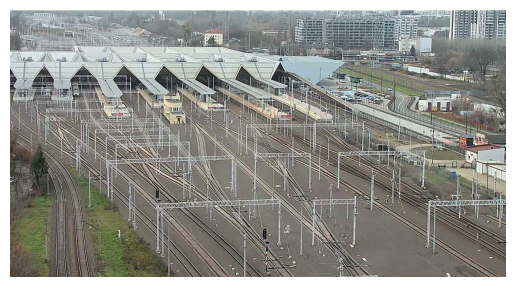

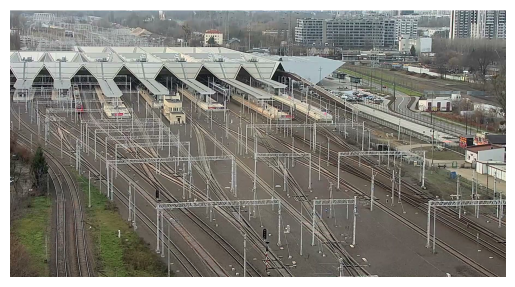

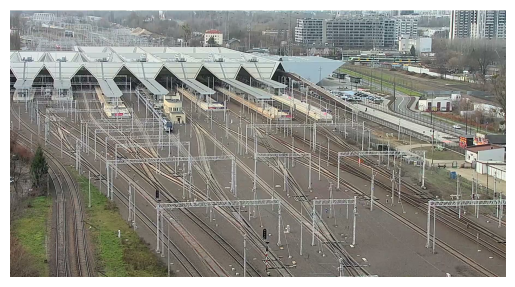

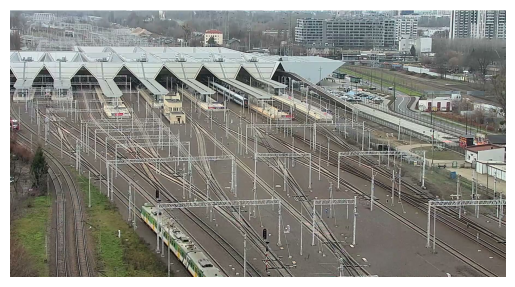

In [30]:
for i in [0,500,1000,1500]:
    plt.imshow(images[i])
    plt.axis('off')
    plt.show()

In [31]:
encoder = Img2Vec(model='alexnet',cuda=True)
vectors = encoder.get_vec(images)

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /basksir/vhome/jgorczynski/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100.0%


In [32]:
vectors.shape

(1554, 4096)

In [45]:
from sklearn.model_selection import train_test_split

idexes = np.arange(len(images))
train_idxs, test_idxs = train_test_split(
    idexes,
    test_size=0.2, 
    random_state=42 
)

train_images = np.array([images[x] for x in train_idxs])
train_vectors =  np.array([vectors[x] for x in train_idxs])

test_images =  np.array([images[x] for x in test_idxs])
test_vectors =  np.array([vectors[x] for x in test_idxs])

In [46]:
train_vectors.shape

(1243, 4096)

In [47]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [48]:
from torch.utils.data import DataLoader, TensorDataset
train_tensor = torch.tensor(train_vectors, dtype=torch.float32)
test_tensor  = torch.tensor(test_vectors, dtype=torch.float32)

dataset = TensorDataset(train_tensor)
loader = DataLoader(dataset, batch_size=32, shuffle=True)

In [49]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Linear(4096, 1024),
            nn.ReLU(),
            nn.Linear(1024, 256),
            nn.ReLU(),
            nn.Linear(256, 64),
            nn.ReLU(),
            nn.Linear(64, 16)
        )
        
        self.decoder = nn.Sequential(
            nn.Linear(16, 64),
            nn.ReLU(),
            nn.Linear(64, 256),
            nn.ReLU(),
            nn.Linear(256, 1024),
            nn.ReLU(),
            nn.Linear(1024, 4096)
        )

    def forward(self, x):
        latent = self.encoder(x)
        reconstructed = self.decoder(latent)
        return reconstructed

In [61]:
model = AutoEncoder().to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters())

In [62]:
num_epochs = 60
train_losses = []
test_losses = []

for epoch in range(num_epochs):
    model.train()
    total_train_loss = 0.0
    
    for (x,) in loader:
        x = x.to(device)
        optimizer.zero_grad()
        x_recon = model(x)
        loss = criterion(x_recon, x)
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()
    
    avg_train_loss = total_train_loss / len(loader)
    train_losses.append(avg_train_loss)
    
    # Compute test loss
    model.eval()
    with torch.no_grad():
        test_recon = model(test_tensor.to(device))
        test_loss = criterion(test_recon, test_tensor.to(device)).item()
        test_losses.append(test_loss)
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.6f}, Test Loss: {test_loss:.6f}")

Epoch [1/60], Train Loss: 0.284345, Test Loss: 0.081729
Epoch [2/60], Train Loss: 0.080081, Test Loss: 0.078024
Epoch [3/60], Train Loss: 0.079189, Test Loss: 0.077847
Epoch [4/60], Train Loss: 0.079412, Test Loss: 0.077986
Epoch [5/60], Train Loss: 0.079103, Test Loss: 0.076964
Epoch [6/60], Train Loss: 0.068355, Test Loss: 0.058915
Epoch [7/60], Train Loss: 0.058243, Test Loss: 0.054837
Epoch [8/60], Train Loss: 0.053482, Test Loss: 0.053077
Epoch [9/60], Train Loss: 0.051946, Test Loss: 0.051993
Epoch [10/60], Train Loss: 0.051676, Test Loss: 0.050458
Epoch [11/60], Train Loss: 0.048493, Test Loss: 0.047218
Epoch [12/60], Train Loss: 0.045958, Test Loss: 0.045165
Epoch [13/60], Train Loss: 0.043364, Test Loss: 0.043464
Epoch [14/60], Train Loss: 0.041644, Test Loss: 0.043939
Epoch [15/60], Train Loss: 0.039213, Test Loss: 0.037141
Epoch [16/60], Train Loss: 0.034420, Test Loss: 0.034785
Epoch [17/60], Train Loss: 0.033613, Test Loss: 0.034336
Epoch [18/60], Train Loss: 0.031159, Tes

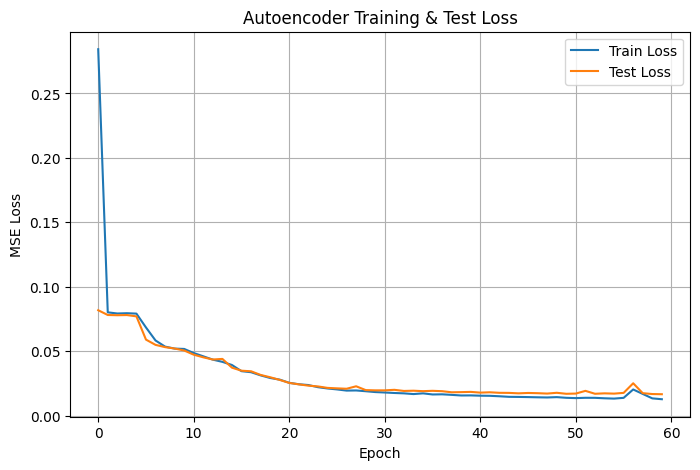

In [63]:
plt.figure(figsize=(8,5))
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('Autoencoder Training & Test Loss')
plt.legend()
plt.grid(True)
plt.show()

In [80]:
with torch.no_grad():
    reconstructed = model(train_tensor.to(device))
    
criterion_per_element = nn.MSELoss(reduction='none')
per_element_loss = criterion_per_element(reconstructed, train_tensor.to(device))
per_vec_loss = per_element_loss.mean(dim=1)

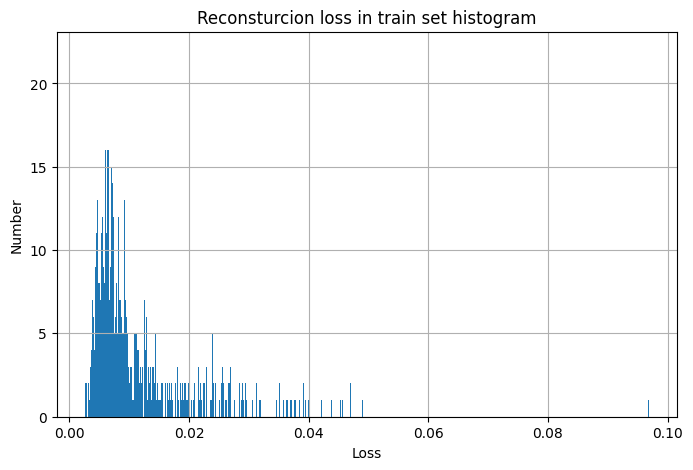

In [89]:
plt.figure(figsize=(8,5))
plt.hist(per_vec_loss.cpu(),bins=len(per_vec_loss))
plt.xlabel('Loss')
plt.ylabel('Number')
plt.title('Reconsturcion loss in train set histogram')
plt.grid(True)
plt.show()

In [91]:
top10_loss_values, top10_indices = torch.topk(per_vec_loss, 10)

In [92]:
top10_indices

tensor([ 488, 1207,  158, 1140,   93, 1055, 1067,   52, 1109,   12],
       device='cuda:0')

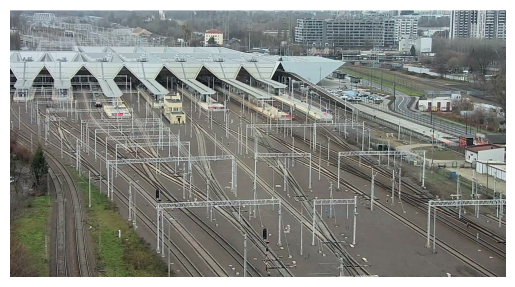

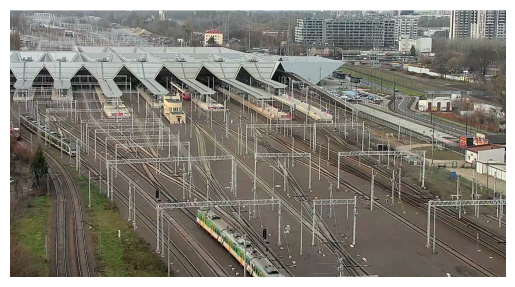

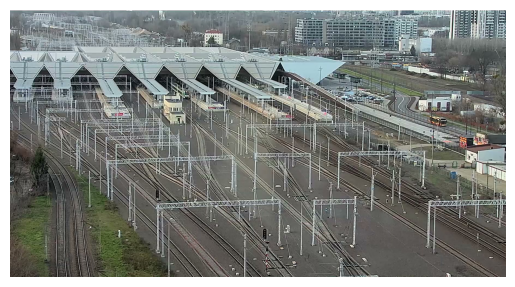

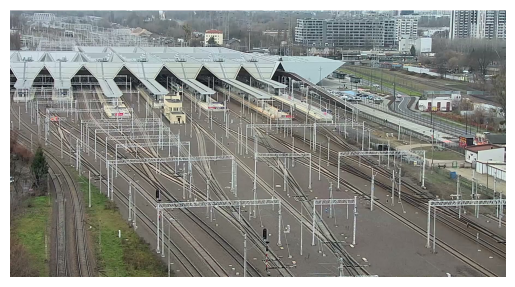

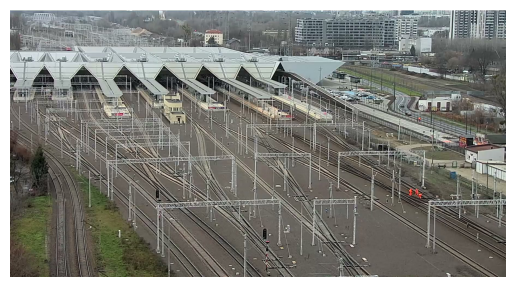

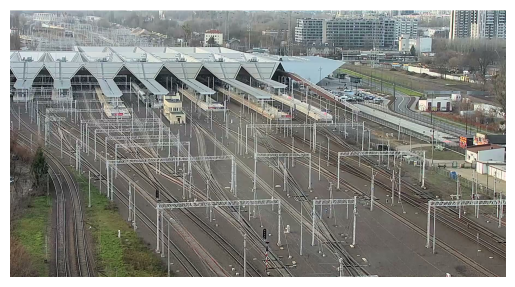

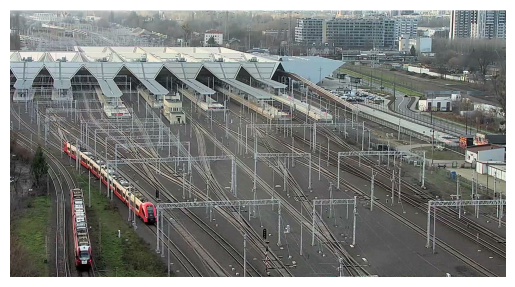

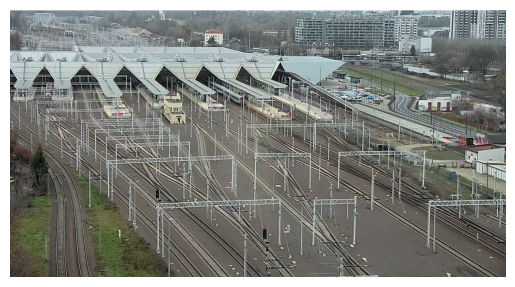

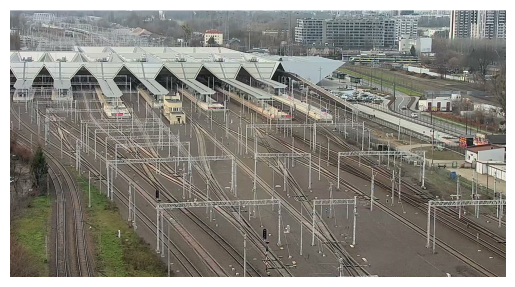

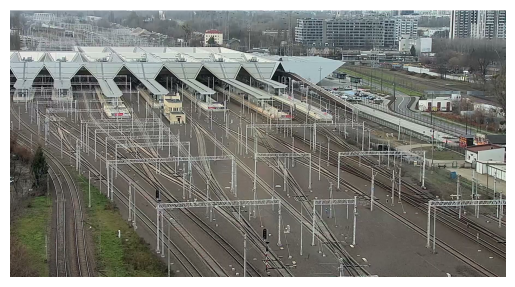

In [93]:
for i in top10_indices:
    plt.imshow(images[i])
    plt.axis('off')
    plt.show()

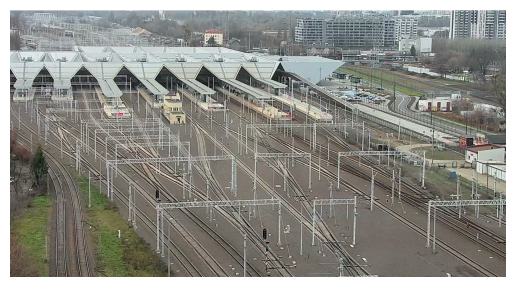

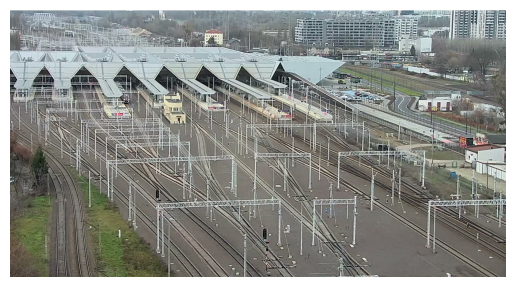

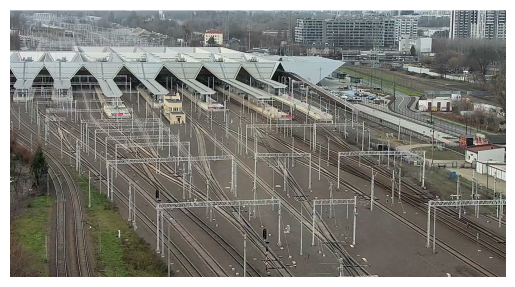

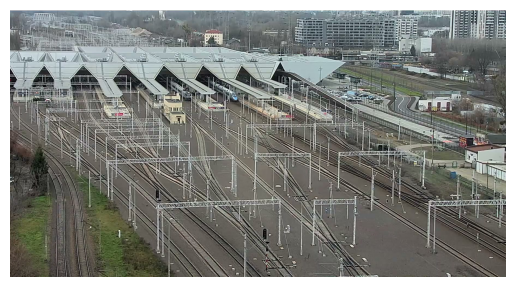

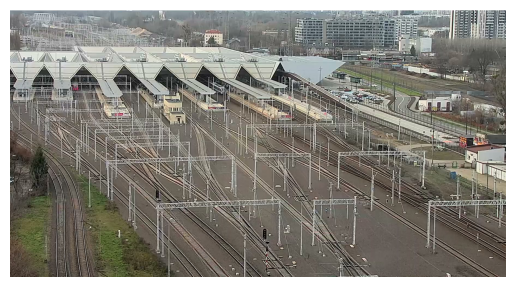

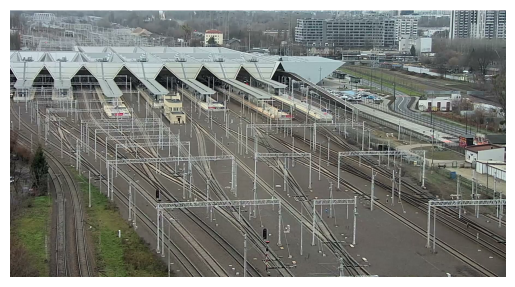

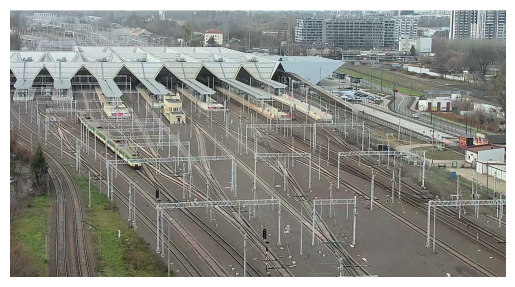

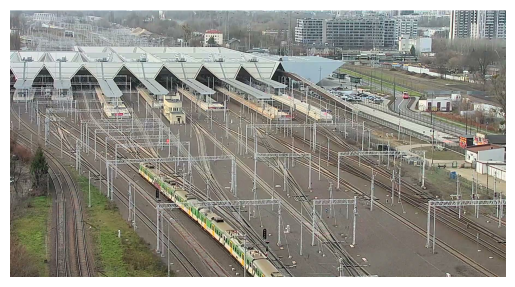

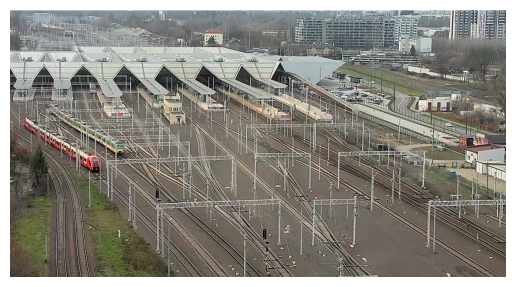

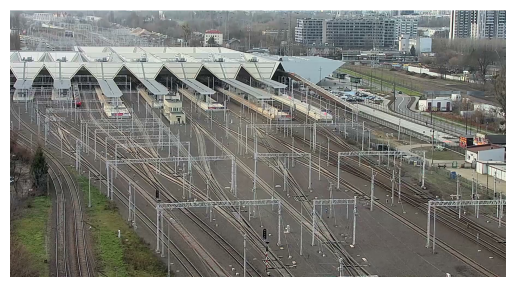

In [103]:
import random
for i in random.sample(range(0, len(train_images)),10):
    plt.imshow(images[i])
    plt.axis('off')
    plt.show()